In [1]:
using FredData, DataFrames, Plots, Statistics

# Solow

Something  

In [2]:
mutable struct Solow_Swan
    n::Float64    # population growth rate
    s::Float64    # savings rate
    δ::Float64    # depreciation rate
    α::Float64    # share of labor
    z::Float64    # technology constant
    k::Float64    # initial capital stock
end

Somee
$$ k^\star =\frac{s \cdot z}{\delta + n}^ {\frac{1}{1 - \alpha}} $$


$$ y^\star =   \biggl( z \cdot { \frac{s}{\delta + n}^\alpha }\biggl)^ {\frac{1}{1 - \alpha}} $$


$$ \frac{k}{y}^\star = \frac{\alpha}{\delta + n} $$
This is 

In [3]:
function steady_state(SS::Solow_Swan)
    n, s, δ, α, z = SS.n, SS.s, SS.δ, SS.α, SS.z
    
    return(
        ((s * z) / (δ + n))^(1 / (1 - α)),    # capital_per_worker_steady_state
        (z * (s / (δ + n))^α)^(1 / (1 - α)),  # output_per_worker_steady_state
        α / (δ + n)                           # capital_per_output_steady_state
    )
    end; 

Somemememm

In [4]:
function random_process(SS::Solow_Swan, t::Int)
    randn(t)
end;

fsfh

In [5]:
function log_deviation_coefficients(SS::Solow_Swan)
    # Unpack parameters
    n, δ, α = SS.n, SS.δ, SS.α
       
    return(
        (1 + α * n - δ * (1 - α)) / (1 + n),  # ρ₁  
        (δ + n) / (1 + n)                     # ρ₂  
    )
end;

somef 

In [6]:
function output_per_worker(SS::Solow_Swan, random_process::Float64)
    # Unpack parameters
    α, z, k = SS.α, SS.z, SS.k
    
    # Generate random process of length t for level of technology
    technology_process = z .* exp.(random_process)
    
    # Generate and return output per worker
    return(technology_process * k^α)
end;

somef deaf

In [7]:
function capital_per_worker(SS::Solow_Swan, random_process::Float64)
    # Unpack parameters
    n, s, δ, α, z = SS.n, SS.s, SS.δ, SS.α, SS.z
    
    # Update capital per worker
    return((s * output_per_worker(SS, random_process) + (1 - δ) * SS.k) / (1 + n))
end;

somef deaf

In [8]:
function capital_per_worker_update(SS::Solow_Swan, random_process::Float64)
    # Update current state of capital per worker
    SS.k = capital_per_worker(SS, random_process)
    
end;

afae

In [9]:
function capital_per_output(SS::Solow_Swan, random_process::Float64)
    # Generate and return capital per output
    capital_per_worker(random_process) / output_per_worker(random_process)
end;

adfae

In [10]:
function capital_per_worker_log_deviation(SS::Solow_Swan, t::Int, random_process::Array{Float64})
    # Unpack parameter
    k = SS.k
    
    # Unpack steady-state level of capital per worker
    capital_per_worker_steady_state, _, _ = steady_state(SS)
    capital_per_worker_steady_state, _, _ = steady_state(SS)
    
    # Unpack coefficients ρ1 and ρ2
    ρ1, ρ2 = log_deviation_coefficients(SS)
    
    # Generate addends for summation of log deviations of capital 
    # per worker from steady state of length t
    if t == 1
        capital_per_worker_log_deviation_addend = log.(k / capital_per_worker_steady_state)
    else
        capital_per_worker_log_deviation_addend = zeros(t)            
        for i in 1:t
            capital_per_worker_log_deviation_addend[i] = ρ2 * ρ1^i * random_process[(t+1)-i]
        end
    end
    
    # Generate and return log deviation of output per worker from steady state
    capital_per_worker_log_deviation = sum(capital_per_worker_log_deviation_addend)
    
    return(capital_per_worker_log_deviation)
end;

dafeq

In [11]:
function output_per_worker_log_deviation(SS::Solow_Swan, t::Int, random_process::Array{Float64,1})
    #Unpack parameter
    α = SS.α
    
    # Unpack coefficients ρ1 and ρ2
    ρ1, ρ2 = log_deviation_coefficients(SS)
    
    # Generate and return log deviation of output per worker from steady state
    output_per_worker_log_deviation = random_process[t] + α * capital_per_worker_log_deviation(SS, t, random_process)
    
    return(output_per_worker_log_deviation)
end;

sfsr

In [12]:
function sequence(SS::Solow_Swan, t::Int)
    # Unpack parameters
    n, s, δ, α, z = SS.n, SS.s, SS.δ, SS.α, SS.z
    
    # Unpack coefficients ρ1 and ρ2
    ρ1, ρ2 = log_deviation_coefficients(SS)
    
    # Generate time series of length t for capital per worker, output per worker, and capital
    # per worker
    capital_per_worker_path = zeros(t)
    output_per_worker_path = zeros(t)
    capital_per_output_path = zeros(t)
    
    # Generate time series of length t for log deviations of capital per worker and output per
    # worker from steady state
    capital_per_worker_log_deviation_path = zeros(t)
    output_per_worker_log_deviation_path = zeros(t)
    
    # Generate random process of length t for level of technology
    process = random_process(SS, t)
    technology_process = z * exp.(process)
    
    for i in 1:t
        # Compute current level of capital per output, output per worker, and capital per output
        capital_per_worker_path[i] = SS.k
        output_per_worker_path[i] = output_per_worker(SS, process[i])
        capital_per_output_path[i] = capital_per_worker_path[i] / output_per_worker_path[i]
        
        # Update current state of capital per worker
        capital_per_worker_update(SS, process[i])
        
        # Compute current level of log deviations of capital per output, output per worker, and
        # capital per output from steady state
        capital_per_worker_log_deviation_path[i] = capital_per_worker_log_deviation(SS, i, process)
        output_per_worker_log_deviation_path[i] = output_per_worker_log_deviation(SS, i, process)
    end

    return(
        capital_per_worker_path, output_per_worker_path, 
        capital_per_output_path, capital_per_worker_log_deviation_path, 
        output_per_worker_log_deviation_path, process
    )
end;

<br>

# Execution

In [20]:
solow = Solow_Swan(
    0.02,          # = n
    0.20,          # = s
    0.10,          # = δ
    0.36,          # = α
    1.00,          # = z
    2033.06 #0.01  # = k
);

In [23]:
t = 286
x = Array(1:t)
k, y, ky, k_deviation, y_deviation, process = sequence(solow, t);

In [ ]:
plot()

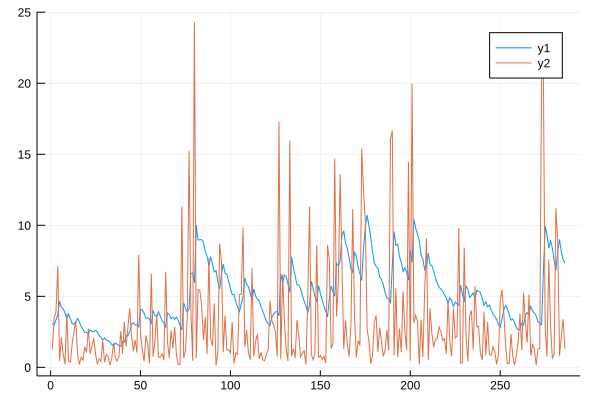

In [25]:
plot(x, [k, y])

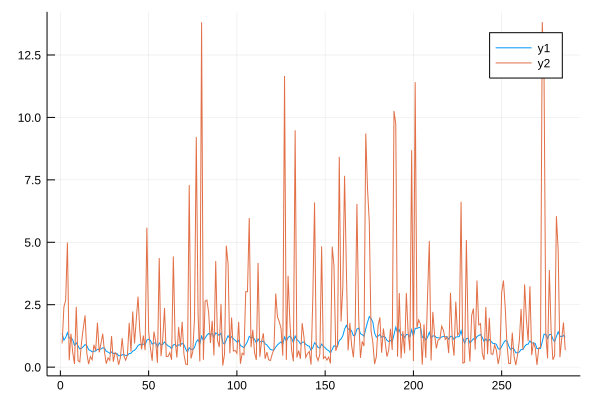

In [27]:
plot(x, [exp.(k_deviation) exp.(y_deviation)])

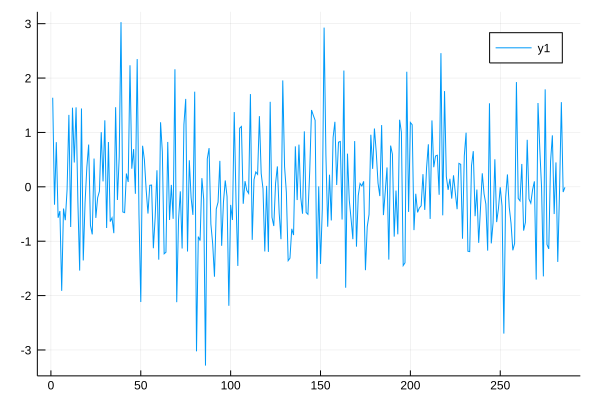

In [70]:
plot(x, process)

<br>

# Fed Data

In [29]:
data_l = log.(get_data(Fred(), "A939RX0Q048SBEA").data.value)
t = length(data_l)
fod_l = Array{Float64, 1}(1:t-1)
for t_i in 1:t-1
    fod_l[t_i] = data_l[t_i+1]-data_l[t_i]
end

API key loaded.
